# Visualization:
    
From past notebook, it is too heavy so, we are using visual tools

- keyword dataset being used. Not ecosystem

In [1]:
import warnings
warnings.filterwarnings(action='ignore', category=UserWarning, module='gensim')

import nltk
import gensim

In [2]:
from IPython.core.display import HTML
css = open('style-table.css').read() + open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [3]:
# Visualization 
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [4]:
# plotly
import plotly
import plotly.offline as pyo
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import plotly.graph_objs as go

In [5]:
# plotly
import plotly.graph_objs as go
import plotly.offline as py
from plotly.graph_objs import *
import plotly.figure_factory as ff

py.init_notebook_mode()

In [6]:
# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes
output_notebook()

Loading BokehJS ...

In [7]:
import nltk
import sys
import re, numpy as np, pandas as pd

# Loading data

In [8]:
import pickle
#Loading from firm cleaned file
patent = pd.read_pickle('eda.pkl')
patent.shape

(68762, 38)

In [9]:
patent_abst=patent['appln_abstr']

In [10]:
chars = list(set(patent_abst)) 
data_size, vocab_size = len(patent_abst), len(chars)
print ("Patent data has chars", data_size)
print ("Patent data has unique chars", vocab_size)

Patent data has chars 68762
Patent data has unique chars 60323


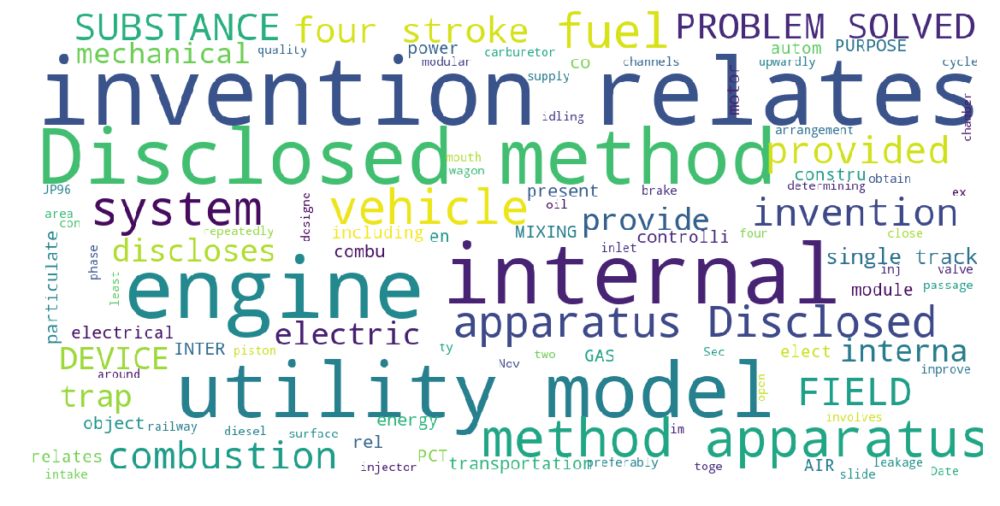

In [11]:
from wordcloud import WordCloud, STOPWORDS
stopwords=set(STOPWORDS)

def Mywordcloud (data, title=None):
    wordcloud=WordCloud(
    background_color='white',
    stopwords=stopwords,
    max_words= 100 ,
    max_font_size=40 ,
    scale=3,
    random_state=1
    ).generate(str(data))
    
    fig=plt.figure(1 , figsize(20, 20))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)
    
    plt.imshow(wordcloud)
    plt.show()
Mywordcloud(patent['appln_abstr'].dropna())

# 3)- Working with topic model analysis

We shall use dataset generated from topic modeling. 

This will contain key info about "document No.", "Dominating Topic", "contribution", "keywords", "text"

In [12]:
# load topic model dataset
df_dominant_topic = pd.read_pickle('top08_topic_dominant.pkl')
df_dominant_topic.shape

(68762, 5)

In [13]:
df_dominant_topic.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.8586,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
1,1,2.0,0.8034,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
2,2,5.0,0.3665,"body, side, utility, end, model, support, part...","[object, provide, particulate, trap, diesel, e..."
3,3,5.0,0.5438,"body, side, utility, end, model, support, part...","[purpose, obtain, trap, leakage, exhaust, gas,..."
4,4,5.0,0.3044,"body, side, utility, end, model, support, part...","[particulate, trap, diesel, engine, design, ef..."


In [14]:
# Loading model i.e TF-IDF from File 3

from gensim.models import LdaModel
optimal_model  = LdaModel.load('optimal_topic_model')

In [15]:
# Load corpus and id2word

corpus_tfidf  = LdaModel.load('corpus_tfidf')
id2word  = LdaModel.load('id2word')

In [16]:
df_dominant_topic.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.8586,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
1,1,2.0,0.8034,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
2,2,5.0,0.3665,"body, side, utility, end, model, support, part...","[object, provide, particulate, trap, diesel, e..."
3,3,5.0,0.5438,"body, side, utility, end, model, support, part...","[purpose, obtain, trap, leakage, exhaust, gas,..."
4,4,5.0,0.3044,"body, side, utility, end, model, support, part...","[particulate, trap, diesel, engine, design, ef..."


### 3.a)- Find count of each topic in document

In [17]:
df_dominant_topic.Dominant_Topic.value_counts()

3.0    16775
2.0    14176
5.0     9717
1.0     9127
7.0     8172
4.0     5822
6.0     3783
0.0     1190
Name: Dominant_Topic, dtype: int64

In [18]:
value_counts = df_dominant_topic['Dominant_Topic'].value_counts(dropna=True, sort=True)
data = value_counts.rename_axis('Topic-Number').reset_index(name='Counts')
df_val_counts = pd.DataFrame(data)
df_val_counts

,Topic-Number,Counts
0,3.0,16775
1,2.0,14176
2,5.0,9717
3,1.0,9127
4,7.0,8172
5,4.0,5822
6,6.0,3783
7,0.0,1190


### 3.b)- wordCloud

In [19]:
import nltk; nltk.download('stopwords')
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\69785hsh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

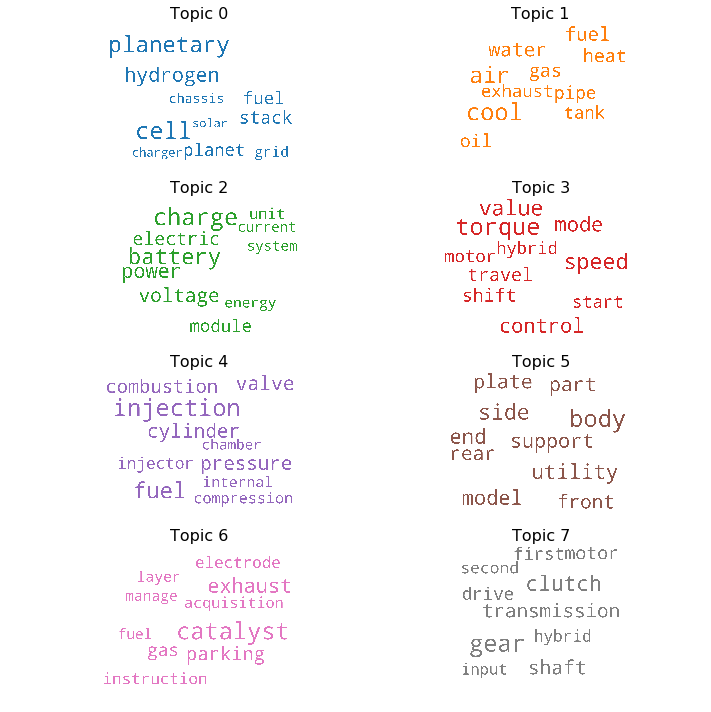

In [21]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = optimal_model.show_topics(formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(10,10), sharex=True, sharey=True) # watch this value

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1]) # for 8 topics
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### 3.c)- Barplot

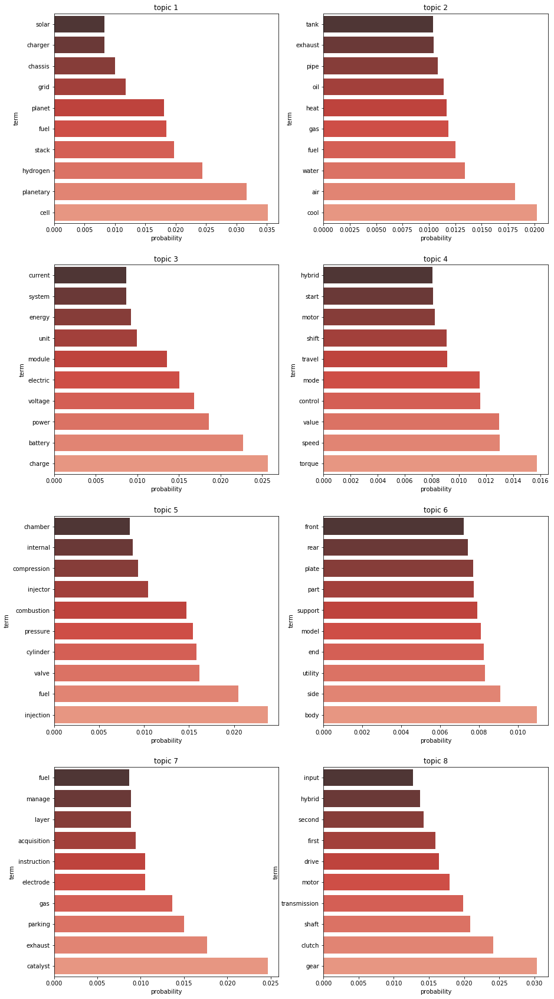

In [22]:
fiz=plt.figure(figsize=(15,30))
for i in range(8):
    df=pd.DataFrame(optimal_model.show_topic(i), columns=['term','prob']).set_index('term')
    df=df.sort_values('prob')
    
    plt.subplot(4,2,i+1)
    plt.title('topic '+str(i+1))
    sns.barplot(x='prob', y=df.index, data=df, label='patents', palette='Reds_d')
    plt.xlabel('probability')
    

plt.show()

### 3.d)-PyVis

In [23]:
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(optimal_model, corpus_tfidf, dictionary=optimal_model.id2word)
vis

C:\Program Files\Anaconda3\lib\site-packages\numexpr\cpuinfo.py:109: DeprecationWarning:

invalid escape sequence \d

C:\Program Files\Anaconda3\lib\site-packages\numexpr\cpuinfo.py:662: DeprecationWarning:

invalid escape sequence \s

C:\Program Files\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.178476 -0.147306       1        1  20.330484
2     -0.132559  0.012076       2        1  17.802584
5     -0.028451  0.251160       3        1  13.763574
1      0.122887  0.096611       4        1  13.013582
7     -0.202176  0.018052       5        1  12.269716
4      0.032106 -0.101780       6        1  10.117696
6      0.181084 -0.162556       7        1   7.332423
0      0.205587  0.033744       8        1   5.369935, topic_info=     Category         Freq            Term        Total  loglift  logprob
term                                                                     
402   Default  1432.000000            gear  1432.000000  30.0000  30.0000
3     Default  1479.000000            cell  1479.000000  29.0000  29.0000
379   Default  1100.000000          clutch  1100.000000  28.0000  28.0000
228   Default   866.000000       injection   866.000000  27.0000  27.0000
168   Default  2114.000000            fuel  2114.000000  26.0000  26.0000
2149  Default   588.000000       planetary   588.000000  25.0000  25.0000
4     Default  1831.000000          charge  1831.000000  24.0000  24.0000
815   Default  1513.000000          torque  1513.000000  23.0000  23.0000
392   Default  1099.000000           shaft  1099.000000  22.0000  22.0000
1393  Default   653.000000        catalyst   653.000000  21.0000  21.0000
467   Default   957.000000            cool   957.000000  20.0000  20.0000
40    Default  1014.000000    transmission  1014.000000  19.0000  19.0000
95    Default  1029.000000         exhaust  1029.000000  18.0000  18.0000
979   Default   461.000000        hydrogen   461.000000  17.0000  17.0000
773   Default  1147.000000         voltage  1147.000000  16.0000  16.0000
97    Default  1120.000000             gas  1120.000000  15.0000  15.0000
2     Default  1867.000000         battery  1867.000000  14.0000  14.0000
1295  Default   536.000000           stack   536.000000  13.0000  13.0000
284   Default   977.000000           valve   977.000000  12.0000  12.0000
45    Default  1265.000000             air  1265.000000  11.0000  11.0000
393   Default  1318.000000           speed  1318.000000  10.0000  10.0000
481   Default   742.000000           water   742.000000   9.0000   9.0000
53    Default   890.000000        cylinder   890.000000   8.0000   8.0000
954   Default  1226.000000          hybrid  1226.000000   7.0000   7.0000
273   Default  1078.000000        pressure  1078.000000   6.0000   6.0000
24    Default  2000.000000           power  2000.000000   5.0000   5.0000
386   Default   946.000000          module   946.000000   4.0000   4.0000
1350  Default   353.000000         parking   353.000000   3.0000   3.0000
2274  Default   311.000000          planet   311.000000   2.0000   2.0000
462   Default  1736.000000           motor  1736.000000   1.0000   1.0000
...       ...          ...             ...          ...      ...      ...
2978   Topic8    45.451088         standby    46.498245   2.9016  -5.9350
2606   Topic8    44.678894        sprocket    45.725098   2.9012  -5.9521
2892   Topic8    42.873093      passageway    43.922428   2.9002  -5.9934
3667   Topic8    40.944031      scheduling    42.003738   2.8988  -6.0394
2555   Topic8    93.722809         cathode    97.201195   2.8879  -5.2113
1797   Topic8   129.023132          master   135.147720   2.8780  -4.8916
2149   Topic8   544.047241       planetary   588.921631   2.8451  -3.4526
979    Topic8   418.856384        hydrogen   461.181946   2.8281  -3.7141
1352   Topic8    86.945572        recharge    92.173958   2.8660  -5.2864
2882   Topic8   103.259720       vehicular   113.613655   2.8288  -5.1144
1142   Topic8    93.912788            chip   108.697952   2.7781  -5.2093
1295   Topic8   339.033386           stack   536.299316   2.4658  -3.9255
3      Topic8   604.286682            cell  1479.354248   2.0290  -3.3476
975    Topic8

In [24]:
pyLDAvis.save_html(vis, 'topics_pyvis.html')

### 3.e)-Heatmap

In [25]:
def plot_difference(mdiff, title="", annotation=None):
    """
    Helper function to plot difference between models
    """
    annotation_html = None
    if annotation is not None:
        annotation_html = [["+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                            for (int_tokens, diff_tokens) in row]
                           for row in annotation]
        
    data = Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = Layout(width=950, height=950, title=title,
                       xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    
    figure2= go.Figure(dict(data=[data], layout=layout))
    py.plot(figure2,filename='heatmap.html') # saving results as html
    #py.iplot(dict(data=[data], layout=layout))

In [26]:
difference_matrix, annotation = optimal_model.diff(optimal_model, distance='jensen_shannon', num_words=50)
plot_difference(difference_matrix, title="Topic difference [jensen shannon distance]", annotation=annotation)

### 3.f)-Dendrogram

In [27]:
from scipy import spatial as scs
from scipy.cluster import hierarchy as sch
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon

# get topic distributions
topic_dist = optimal_model.state.get_lambda()

# get topic terms
num_words = 300
topic_terms = [{w for (w, _) in optimal_model.show_topic(topic, topn=num_words)} for topic in range(topic_dist.shape[0])]

# no. of terms to display in annotation
n_ann_terms = 8

# use Jensen-Shannon distance metric in dendrogram
def js_dist(X):
    return pdist(X, lambda u, v: jensen_shannon(u, v))

# define method for distance calculation in clusters
linkagefun=lambda x: sch.linkage(x, 'single')

# calculate text annotations
def text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun):
    # get dendrogram hierarchy data
    linkagefun = lambda x: sch.linkage(x, 'single')
    d = js_dist(topic_dist)
    Z = linkagefun(d)
    P = sch.dendrogram(Z, orientation="bottom", no_plot=True)

    # store topic no.(leaves) corresponding to the x-ticks in dendrogram
    x_ticks = np.arange(5, len(P['leaves']) * 10 + 5, 10)
    x_topic = dict(zip(P['leaves'], x_ticks))

    # store {topic no.:topic terms}
    topic_vals = dict()
    for key, val in x_topic.items():
        topic_vals[val] = (topic_terms[key], topic_terms[key])

    text_annotations = []
    # loop through every trace (scatter plot) in dendrogram
    for trace in P['icoord']:
        fst_topic = topic_vals[trace[0]]
        scnd_topic = topic_vals[trace[2]]
        
        # annotation for two ends of current trace
        pos_tokens_t1 = list(fst_topic[0])[:min(len(fst_topic[0]), n_ann_terms)]
        neg_tokens_t1 = list(fst_topic[1])[:min(len(fst_topic[1]), n_ann_terms)]

        pos_tokens_t4 = list(scnd_topic[0])[:min(len(scnd_topic[0]), n_ann_terms)]
        neg_tokens_t4 = list(scnd_topic[1])[:min(len(scnd_topic[1]), n_ann_terms)]

        t1 = "<br>".join((": ".join(("+++", str(pos_tokens_t1))), ": ".join(("---", str(neg_tokens_t1)))))
        t2 = t3 = ()
        t4 = "<br>".join((": ".join(("+++", str(pos_tokens_t4))), ": ".join(("---", str(neg_tokens_t4)))))

        # show topic terms in leaves
        if trace[0] in x_ticks:
            t1 = str(list(topic_vals[trace[0]][0])[:n_ann_terms])
        if trace[2] in x_ticks:
            t4 = str(list(topic_vals[trace[2]][0])[:n_ann_terms])

        text_annotations.append([t1, t2, t3, t4])

        # calculate intersecting/diff for upper level
        intersecting = fst_topic[0] & scnd_topic[0]
        different = fst_topic[0].symmetric_difference(scnd_topic[0])

        center = (trace[0] + trace[2]) / 2
        topic_vals[center] = (intersecting, different)

        # remove trace value after it is annotated
        topic_vals.pop(trace[0], None)
        topic_vals.pop(trace[2], None)  
        
    return text_annotations

# get text annotations
annotation = text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun)

In [28]:
# Plot dendrogram
dendro = ff.create_dendrogram(topic_dist, distfun=js_dist, labels=range(0, 8), linkagefun=linkagefun, hovertext=annotation)
dendro['layout'].update({'width': 1000, 'height': 600})
py.iplot(dendro)

In [29]:
# saving results as html
py.plot(dendro,filename='Dendrogram.html')

'Dendrogram.html'

### 3.g)-t-SNE

In [30]:
hm = np.array([[y for (x,y) in optimal_model[corpus_tfidf[i]]] for i in range(len(corpus_tfidf))])

In [31]:
from sklearn.manifold import TSNE
tsne = TSNE(random_state=2017, perplexity=30)
embedding = tsne.fit_transform(hm)
embedding = pd.DataFrame(embedding, columns=['x','y'])
embedding['hue'] = hm.argmax(axis=1)

In [32]:
year=patent['year']

In [33]:
source = ColumnDataSource(
        data=dict(
            x = embedding.x,
            y = embedding.y,
            colors = [all_palettes['Set1'][8][i] for i in embedding.hue],
            title = patent.appln_title,
            year = year,
            alpha = [0.9] * embedding.shape[0],
            size = [7] * embedding.shape[0]
        )
    )
hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <span style="font-size: 12px; font-weight: bold;">Year:</span>
            <span style="font-size: 12px">@year</span>
        </div>
    </div>
    """)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset']
plot_tsne = figure(plot_width=700, plot_height=700, tools=tools_tsne, title='Papers')
plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var f = cb_obj.value
    x = data['x']
    y = data['y']
    colors = data['colors']
    alpha = data['alpha']
    title = data['title']
    year = data['year']
    size = data['size']
    for (i = 0; i < x.length; i++) {
        if (year[i] <= f) {
            alpha[i] = 0.9
            size[i] = 7
        } else {
            alpha[i] = 0.05
            size[i] = 4
        }
    }
    source.trigger('change');
""")

slider = Slider(start=year.min(), end=year.max(), value=2017, step=1, title="Before year")
slider.js_on_change('value', callback)

layout = column(slider, plot_tsne)

In [34]:
show(layout)

In [35]:
from bokeh.plotting import figure, output_file, save
output_file("tsne.html")
save(plot_tsne)

'C:\\Users\\69785hsh\\Downloads\\PhD_papers\\Phd_Topic_Modeling\\Neat\\tsne.html'

**working on paper will be in next notebook**